In [1]:
use G10A G10B C8 C8B C1G C1F SEX RANCEST HHINC ED4CAT AGE using "20240-0003-Data.dta", clear


(Collaborative Psychiatric Epidemiology Surveys (CPES), 2001-2003 [United States])


In [2]:
** renaming DV & IV
rename G10A tonewhite 
rename G10B toneblack
rename C8 physhealth
rename C8B menthealth

In [3]:
** Creating a DV
 gen selfesteem = (C1G + C1F)/2

(195 missing values generated)


In [4]:
** Renaming & Recoding CV

gen income = HHINC 

gen education = ED4CAT
recode education 1=0 2=0 3=0 4=1





(education: 6082 changes made)


In [5]:
gen caribbean = RANCEST
recode caribbean 8=. 9=1 10=0 11=. 




(caribbean: 6082 changes made)


In [6]:
gen female = SEX
recode female 1=0 2=1



(female: 6082 changes made)


In [7]:
table tonewhite, c(mean physhealth)
table toneblack, c(mean physhealth)


table tonewhite, c(mean menthealth)
table toneblack, c(mean menthealth)



table tonewhite, c(mean selfesteem)
table toneblack, c(mean selfesteem)



------------------------------
Freq Whts     |
treat R badly |
due to skin   |
shade         | mean(physhe~h)
--------------+---------------
   VERY OFTEN |       2.683951
 FAIRLY OFTEN |       2.673352
NOT TOO OFTEN |       2.521333
  HARDLY EVER |       2.475452
        NEVER |       2.533617
    DONT KNOW |       2.888889
      REFUSED |       2.777778
------------------------------


------------------------------
Freq Blks     |
treat R badly |
due to skin   |
shade         | mean(physhe~h)
--------------+---------------
   VERY OFTEN |       2.787565
 FAIRLY OFTEN |       2.715859
NOT TOO OFTEN |        2.64899
  HARDLY EVER |         2.4785
        NEVER |       2.470268
    DONT KNOW |       2.757576
      REFUSED |            2.4
------------------------------


------------------------------
Freq Whts     |
treat R badly |
due to skin   |
shade         | mean(menthe~h)
--------------+---------------
   VERY OFTEN |        2.30198
 FAIRLY OFTEN |       2.293696
NOT TOO OFTEN

In [7]:
tab physhealth 

gen badhealth = physhealth 
recode badhealth 1=0 2=0 3=0 4=1 5=1
tab badhealth





   Physical |
     health |
     rating |      Freq.     Percent        Cum.
------------+-----------------------------------
  EXCELLENT |      1,017       17.26       17.26
  VERY GOOD |      1,979       33.58       50.84
       GOOD |      1,737       29.48       80.32
       FAIR |        904       15.34       95.66
       POOR |        256        4.34      100.00
------------+-----------------------------------
      Total |      5,893      100.00

(189 missing values generated)

(badhealth: 5893 changes made)


  badhealth |      Freq.     Percent        Cum.
------------+-----------------------------------
          0 |      4,733       80.32       80.32
          1 |      1,160       19.68      100.00
------------+-----------------------------------
      Total |      5,893      100.00


In [8]:
tab menthealth 

gen badment = menthealth 
recode badment 1=0 2=0 3=0 4=1 5=1
tab badment





     Mental |
     health |
     rating |      Freq.     Percent        Cum.
------------+-----------------------------------
  EXCELLENT |      1,805       30.63       30.63
  VERY GOOD |      2,084       35.36       65.99
       GOOD |      1,359       23.06       89.05
       FAIR |        543        9.21       98.27
       POOR |        102        1.73      100.00
------------+-----------------------------------
      Total |      5,893      100.00

(189 missing values generated)

(badment: 5893 changes made)


    badment |      Freq.     Percent        Cum.
------------+-----------------------------------
          0 |      5,248       89.05       89.05
          1 |        645       10.95      100.00
------------+-----------------------------------
      Total |      5,893      100.00


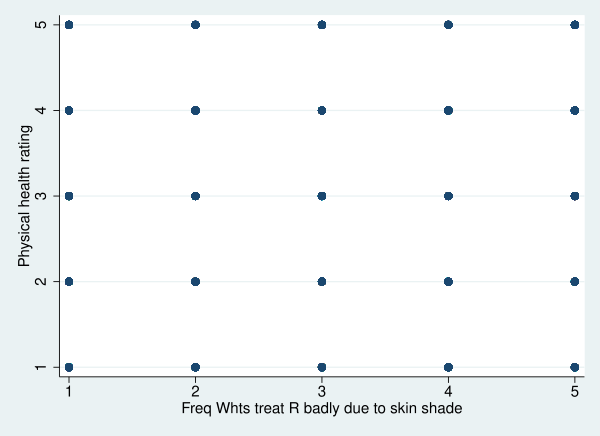

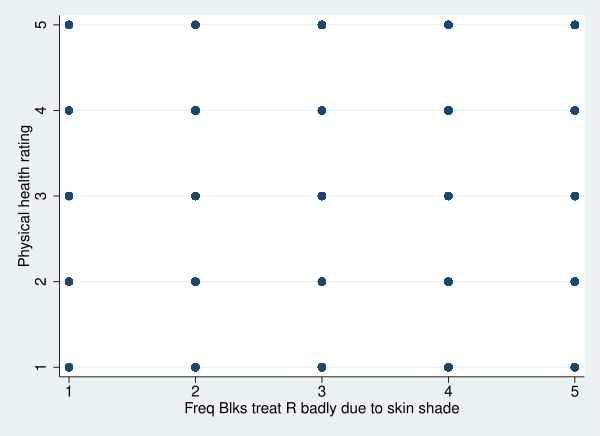

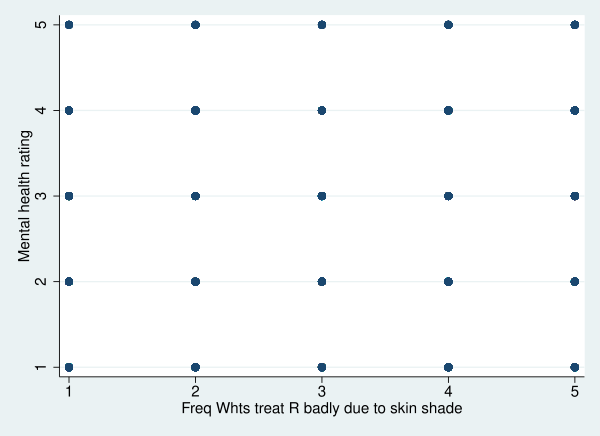

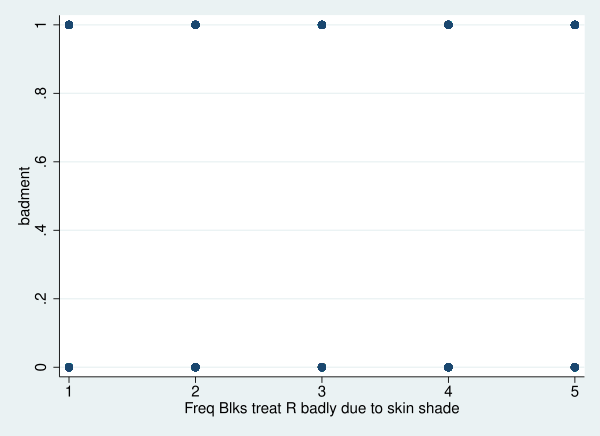

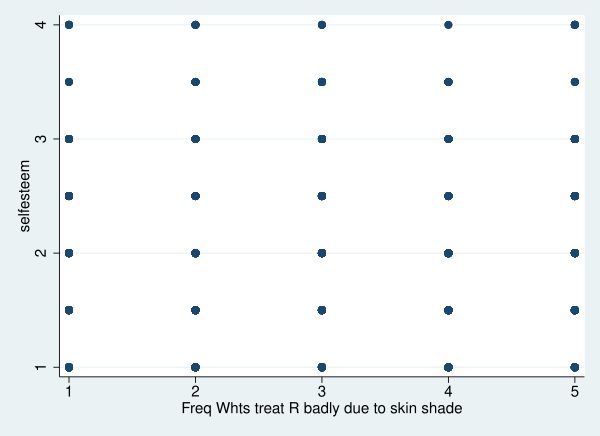

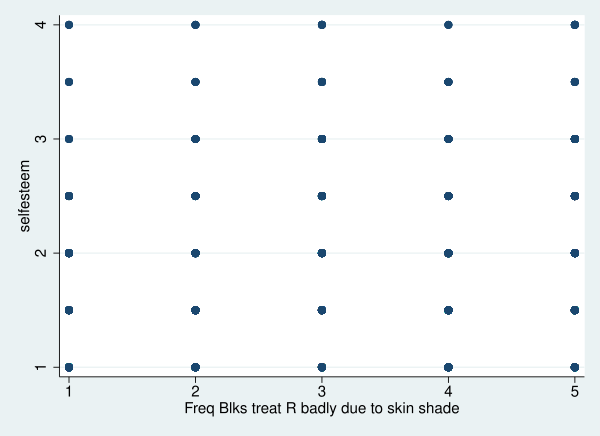

In [44]:
tw scatter physhealth tonewhite 
tw scatter physhealth toneblack 

tw scatter menthealth tonewhite
tw scatter menthealth toneblack

tw scatter selfesteem tonewhite 
tw scatter selfesteem toneblack



In [9]:
**** NEW Recoded ******* 

regress badhealth tonewhite female income education caribbean AGE
qui eststo

regress badment tonewhite female income education caribbean AGE
qui eststo



      Source |       SS           df       MS      Number of obs   =     4,764
-------------+----------------------------------   F(6, 4757)      =     70.57
       Model |  61.8645359         6   10.310756   Prob > F        =    0.0000
    Residual |  695.079209     4,757  .146117135   R-squared       =    0.0817
-------------+----------------------------------   Adj R-squared   =    0.0806
       Total |  756.943745     4,763  .158921634   Root MSE        =    .38225

------------------------------------------------------------------------------
   badhealth |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
   tonewhite |  -.0103571   .0045692    -2.27   0.023    -.0193149   -.0013994
      female |   .0304641    .011733     2.60   0.009      .007462    .0534662
      income |  -1.91e-06   1.96e-07    -9.76   0.000    -2.30e-06   -1.53e-06
   education |   -.050382   .0158647    -3.18   0

In [10]:
%html
esttab, html ///
mlabels ("Physical Health" "Mental Health") ///
collabels(none) drop(_cons) ///
cells(b(star fmt(2)) se(fmt(2) par)) ///
starlevels(^ .1 * .05 ** .01 *** .001) 

This front-end or document format cannot display HTML

In [9]:
***** NEW Recoding ***********


regress badhealth toneblack female income education caribbean AGE
qui eststo

regress badment toneblack female income education caribbean AGE
qui eststo




      Source |       SS           df       MS      Number of obs   =     4,770
-------------+----------------------------------   F(6, 4763)      =     71.11
       Model |  62.4491013         6  10.4081836   Prob > F        =    0.0000
    Residual |  697.143352     4,763   .14636644   R-squared       =    0.0822
-------------+----------------------------------   Adj R-squared   =    0.0811
       Total |  759.592453     4,769  .159277092   Root MSE        =    .38258

------------------------------------------------------------------------------
   badhealth |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
   toneblack |   -.015361   .0048035    -3.20   0.001    -.0247781   -.0059439
      female |   .0267134   .0116802     2.29   0.022     .0038149     .049612
      income |  -1.94e-06   1.96e-07    -9.90   0.000    -2.32e-06   -1.56e-06
   education |  -.0478976   .0158327    -3.03   0

In [10]:
%html
esttab, html ///
mlabels ("Physical Health" "Mental Health") ///
collabels(none) drop(_cons) ///
cells(b(star fmt(2)) se(fmt(2) par)) ///
starlevels(^ .1 * .05 ** .01 *** .001) 


This front-end or document format cannot display HTML

In [70]:
*** Don't Know 

***logit physhealth i.tonewhite
***logit physhealth i.toneblack

In [71]:
*** Don't Know 

***gen badhealth=0 
***replace badhealth=1 
***replace physhealth>3 & physhealth!=. 

In [14]:
** Runnung a correlation Matrix assignment 3 among IV

*correlate toneblack tonewhite

*correlate toneblack tonewhite physhealth menthealth selfesteem

pwcorr physhealth menthealth selfesteem toneblack tonewhite female caribbean income education AGE, star(.05) sig

pwcorr physhealth menthealth selfesteem, star(.05) sig

pwcorr toneblack tonewhite, star(.05) sig


******* NEW 

pwcorr badhealth badment selfesteem toneblack tonewhite female caribbean income education AGE, star(.05) sig
pwcorr badhealth badment, star(.05) sig




             | physhe~h menthe~h selfes~m tonebl~k tonewh~e   female caribb~n
-------------+---------------------------------------------------------------
  physhealth |   1.0000 
             |
             |
  menthealth |   0.4842*  1.0000 
             |   0.0000
             |
  selfesteem |   0.2170*  0.3453*  1.0000 
             |   0.0000   0.0000
             |
   toneblack |  -0.0912* -0.1221* -0.0671*  1.0000 
             |   0.0000   0.0000   0.0000
             |
   tonewhite |  -0.0485* -0.0878* -0.0458*  0.4924*  1.0000 
             |   0.0007   0.0000   0.0013   0.0000
             |
      female |   0.0720*  0.0857*  0.0393* -0.0159   0.0924*  1.0000 
             |   0.0000   0.0000   0.0025   0.2550   0.0000
             |
   caribbean |  -0.0815* -0.0720* -0.0023   0.0947*  0.0703* -0.0327*  1.0000 
             |   0.0000   0.0000   0.8735   0.0000   0.0000   0.0207
             |
      income |  -0.1729* -0.1489* -0.0915*  0.0268   0.0189  -0.1529*  0.1522*
